In [1]:
library(Seurat)
library(ggplot2)
library(wesanderson)
library(patchwork)
library(dplyr)
library(spacexr)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




ERROR: Error in library(spacexr): there is no package called ‘spacexr’


In [ ]:
pal <- wes_palette("Zissou1", 100, type = "continuous")
pal1<-wes_palette("Zissou1")
currentcol<-c('#B40F20',"#E59D07","lightgrey","#6C5B4E","#F69572","#84B678","#E49417","#5BBCD6","#FB7069","#C1BB7B","#F1DD7B","black","dark grey","#6C261C","#A14C29")

In [ ]:
gg_color_hue <- function(n) {
  hues = seq(15, 375, length = n + 1)
  hcl(h = hues, l = 65, c = 100)[1:n]
}

In [3]:
rca <- readRDS("/nfs/vosne/wenduogu/curio_files/curio_spatial_23_05_3samples_1and2_time/analysis/human/results/OUTPUT/1_hrca/1_hrca_seurat.rds")
aorta <- readRDS("/nfs/vosne/wenduogu/curio_files/curio_spatial_23_05_3samples_1and2_time/analysis/human/results/OUTPUT/2_haorta/2_haorta_seurat.rds")

In [5]:
rca

An object of class Seurat 
37527 features across 53359 samples within 2 assays 
Active assay: SCT (15976 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: SPATIAL, pca, umap
 1 image present: slice1

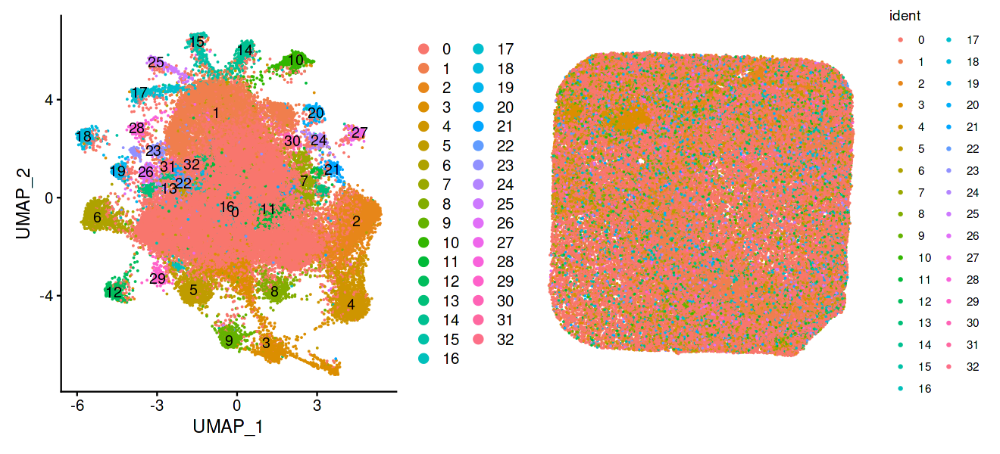

In [8]:
plot1 <- DimPlot(rca, reduction = "umap", label = TRUE)
plot2 <- SpatialDimPlot(rca, stroke = 0)
options(repr.plot.width=11, repr.plot.height=5)
plot1 + plot2

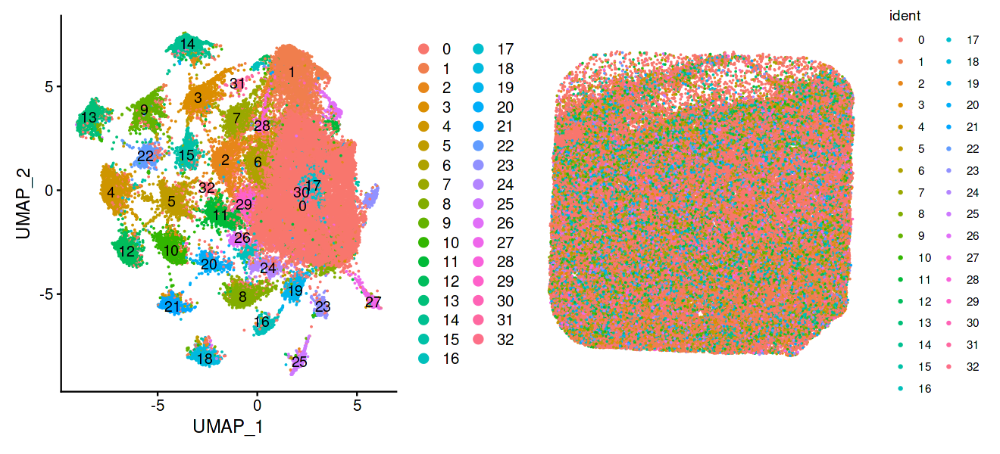

In [9]:
plot1 <- DimPlot(aorta, reduction = "umap", label = TRUE)
plot2 <- SpatialDimPlot(aorta, stroke = 0)
options(repr.plot.width=11, repr.plot.height=5)
plot1 + plot2

In [11]:
rca <- UpdateSeuratObject(rca)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Updating matrix keys for DimReduc ‘SPATIAL’

Updating matrix keys for DimReduc ‘pca’

Updating matrix keys for DimReduc ‘umap’

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Updating slots in SCT

Updating slots in SCT_nn

Setting default assay of SCT_nn to SCT

Updating slots in SCT_snn

Setting default assay of SCT_snn to SCT

Updating slots in SPATIAL

Updating slots in pca

Updating slots in umap

Setting umap DimReduc to global

Updating slots in slice1

Warning message:
“Adding image data that isn't associated with any assays”
Setting assay used for SCTransform.RNA to RNA

Setting assay used for RunPCA.SCT to SCT

Setting assay used for RunUMAP.SCT.pca to SCT

Setting assay used for FindNeighbors.SCT.pca to SCT

No assay information could be found for FindClusters

Warning message:
“Adding a command log without 

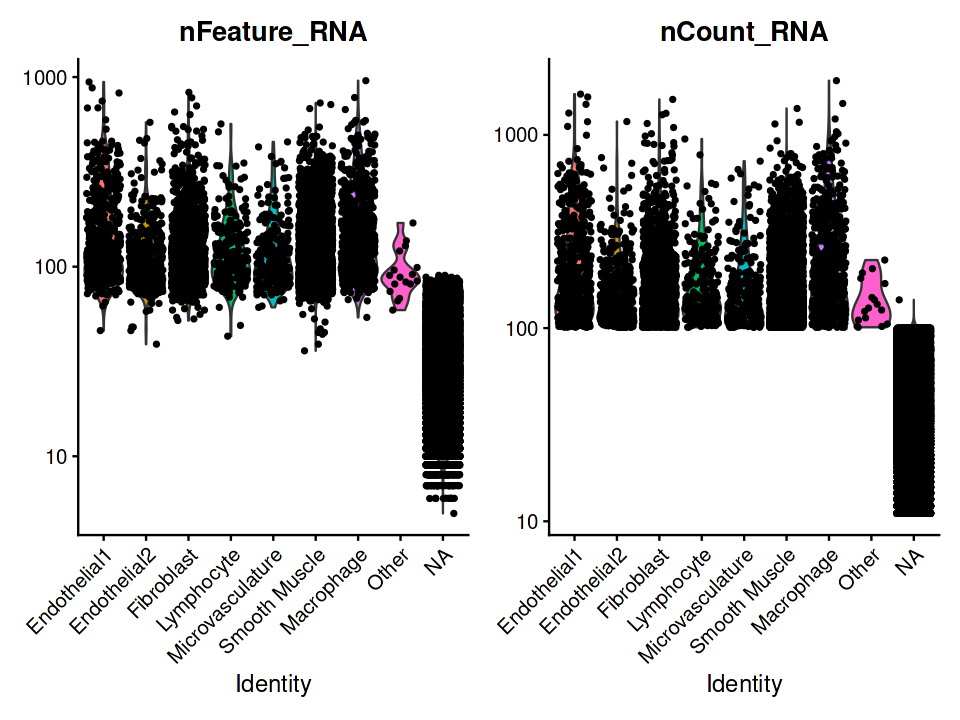

In [71]:
options(repr.plot.width=8, repr.plot.height=6)
VlnPlot(aorta, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2,log = T,group.by = 'first_type')

In [73]:
aorta <- subset(aorta, subset = nCount_RNA > 100)

Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Not validating Seurat objects”


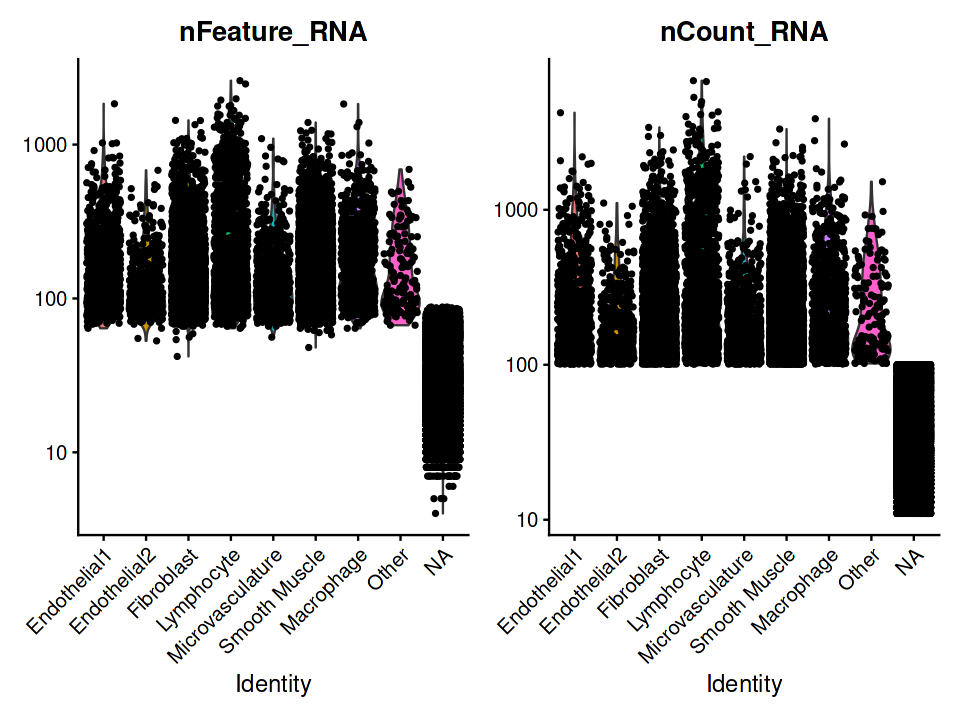

In [72]:
options(repr.plot.width=8, repr.plot.height=6)
VlnPlot(rca, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2,log = T,group.by = 'first_type')

In [74]:
rca<- subset(rca, subset = nCount_RNA > 100)

Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Not validating Seurat objects”


In [10]:
ref <- readRDS("RDS/CZI_processed.rds")
ref <- UpdateSeuratObject(ref)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



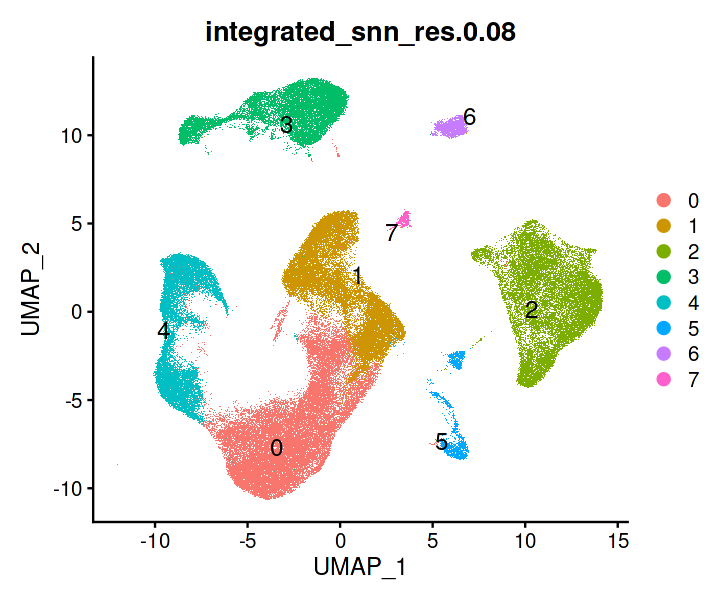

In [7]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "integrated_snn_res.0.08", label = T, label.size = 5,repel = TRUE)

In [4]:
ref$integrated_snn_res.0.08->Idents(ref)
cluster.ids <- c("Smooth Muscle", "Fibroblast", "Macrophage", "Endothelial", "Microvasculature",
                "Lymphocyte","Endothelial","Other Mesencyhmal cells")
names(cluster.ids) <- levels(ref)
ref <- RenameIdents(ref, cluster.ids)
levels(ref)<- c( "Endothelial","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage","Other Mesencyhmal cells")
ref$celltype<-Idents(ref)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



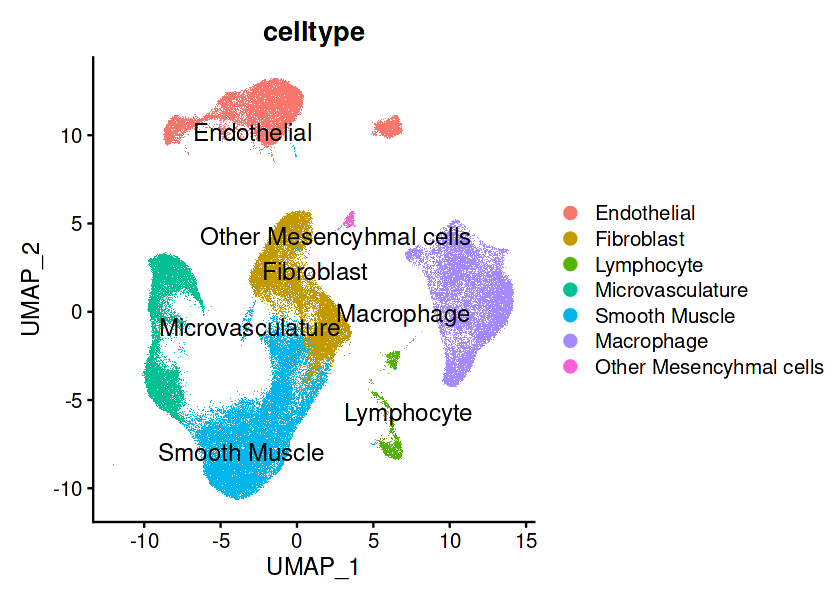

In [8]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "celltype", label = T, label.size = 5,repel = TRUE)

In [12]:
DefaultAssay(ref)<-'integrated'
FindClusters(ref, resolution = 0.1, verbose = FALSE)->ref

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



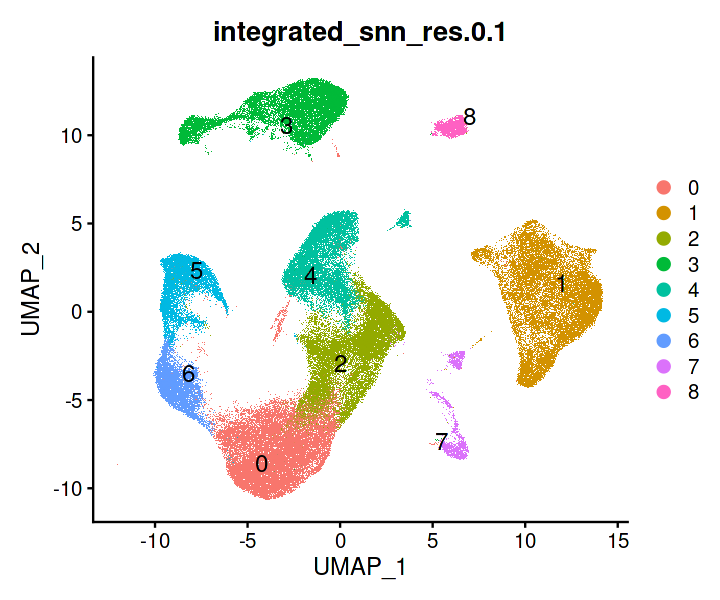

In [14]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "integrated_snn_res.0.1", label = T, label.size = 5,repel = TRUE)

In [15]:
paste(ref$celltype,ref$`integrated_snn_res.0.1`,sep='_')->ref$type_tmp

[1] "Macrophage_1"              "Microvasculature_5"       
 [3] "Fibroblast_4"              "Microvasculature_6"       
 [5] "Endothelial_3"             "Smooth Muscle_2"          
 [7] "Fibroblast_2"              "Smooth Muscle_0"          
 [9] "Lymphocyte_7"              "Other Mesencyhmal cells_4"
[11] "Endothelial_8"             "Smooth Muscle_6"          
[13] "Microvasculature_2"        "Lymphocyte_2"             
[15] "Smooth Muscle_5"           "Microvasculature_0"       
[17] "Smooth Muscle_1"           "Fibroblast_7"             
[19] "Endothelial_0"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



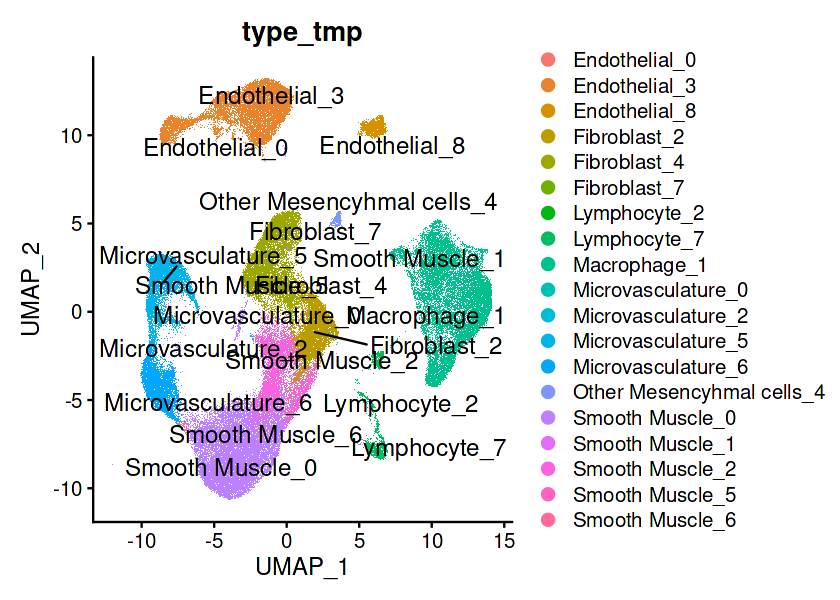

In [20]:
ref$type_tmp->Idents(ref)
levels(ref)
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "type_tmp", label = T, label.size = 5,repel = TRUE)

In [21]:
cluster.ids <- c("Macrophage", "Microvasculature", "Fibroblast", "Microvasculature", "Endothelial",
                "Smooth Muscle_Intimal","Fibroblast","Smooth Muscle_Medial",'Lymphocyte','Other Mesencyhmal cells',
                 'Endothelial',"Smooth Muscle_Medial","Microvasculature","Lymphocyte",'Smooth Muscle_Medial','Microvasculature',
                'Smooth Muscle_Medial','Fibroblast','Endothelial')
names(cluster.ids) <- levels(ref)
ref <- RenameIdents(ref, cluster.ids)
ref$celltype3<-Idents(ref)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



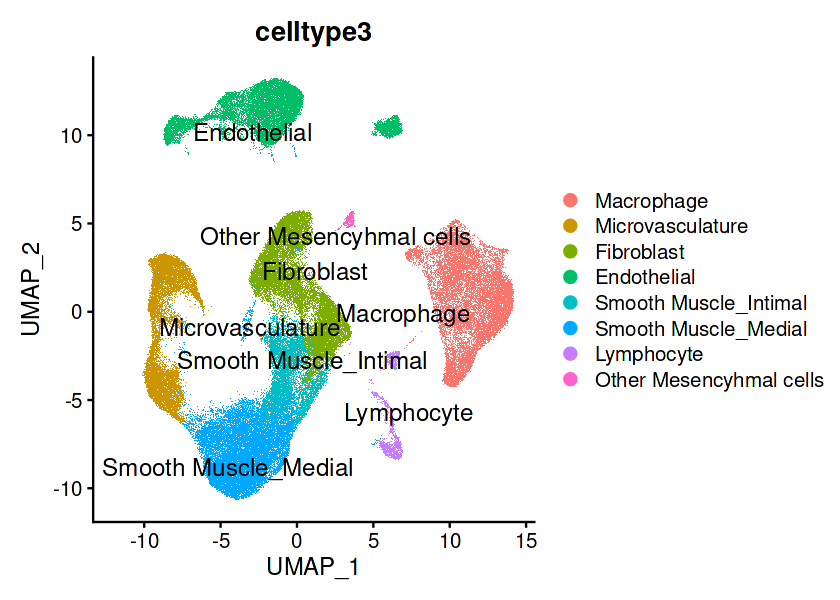

In [23]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "celltype3", label = T, label.size = 5,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



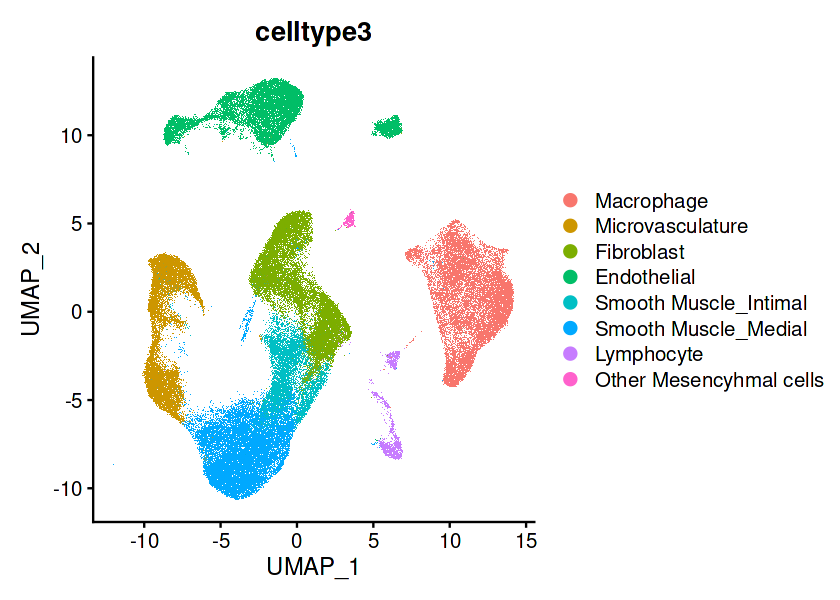

In [24]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(ref, reduction = "umap", group.by = "celltype3", label = F, label.size = 5,repel = TRUE)

In [25]:
saveRDS(ref,'RDS/CZI_processed.rds')

In [85]:
preproc<-function(i,res=0.5){
    i <- SCTransform(i, assay = "RNA", verbose = FALSE)
    i <- RunPCA(i,verbose = FALSE)
    i <- RunUMAP(i, dims = 1:30,verbose = FALSE)
    i <- FindNeighbors(i, dims = 1:30,verbose = FALSE)
    i <- FindClusters(i, resolution = res, verbose = FALSE)
    return(i)
}

In [211]:
preproc(rca,res=1)->rca

In [221]:
FindClusters(rca, resolution = 0.6, verbose = FALSE)->rca

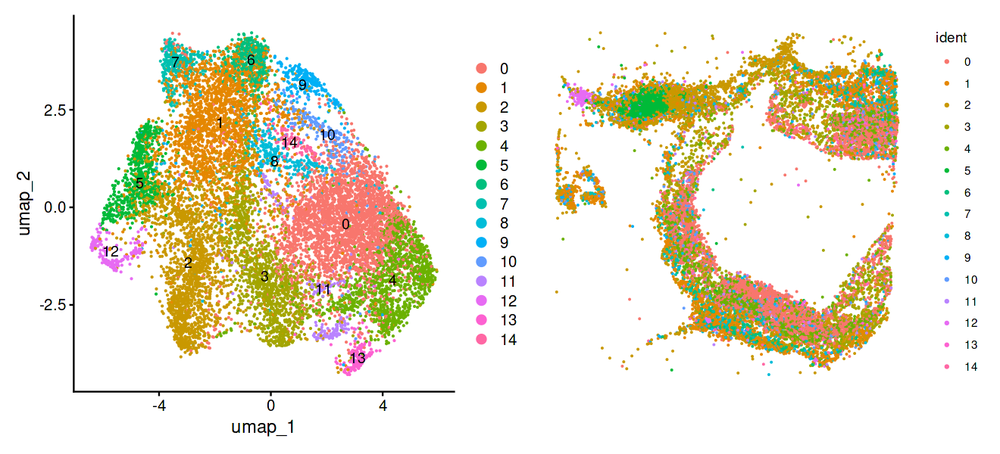

In [222]:
plot1 <- DimPlot(rca, reduction = "umap", label = TRUE)
plot2 <- SpatialDimPlot(rca, stroke = 0)
options(repr.plot.width=11, repr.plot.height=5)
plot1 + plot2

In [88]:
int_w_rna<-function(i){
    DefaultAssay(i)<-'SCT'
    anchors <- FindTransferAnchors(reference = ref, query = i, normalization.method = "SCT",npcs = 50)
    predictions.assay <- TransferData(anchorset = anchors, refdata = ref$celltype3, prediction.assay = TRUE,
                                      weight.reduction = i[["pca"]], dims = 1:50)
    i[["predictions"]] <- predictions.assay
    return(i)
}

In [89]:
int_w_rna(rca)->rca

Normalizing query using reference SCT model

Performing PCA on the provided reference using 1700 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 1262 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Layer counts isn't present in the assay object; returning NULL”


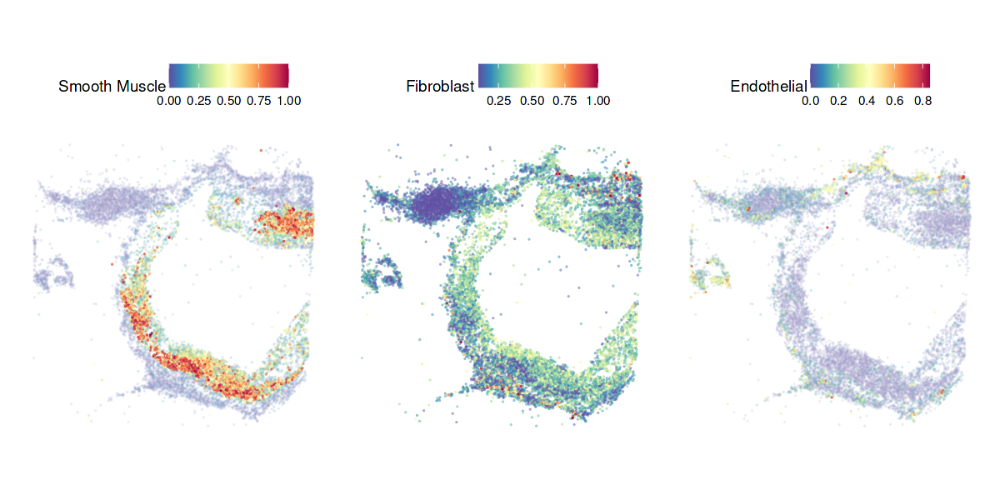

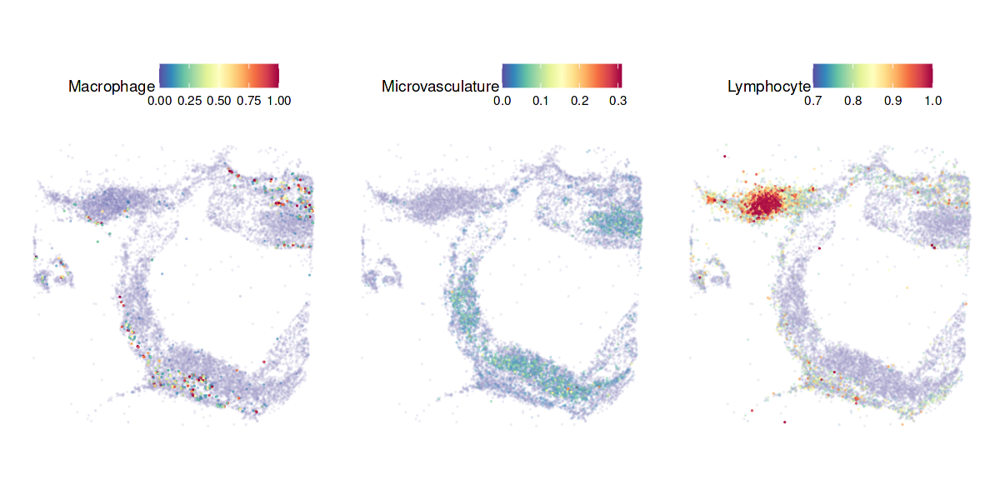

In [187]:
DefaultAssay(rca) <- "predictions"
options(repr.plot.width=10, repr.plot.height=5)
SpatialFeaturePlot(rca, features = c("Smooth Muscle"), alpha = c(0.1, 1))->p1
SpatialFeaturePlot(rca, features = c("Fibroblast"), min.cutoff=0.1,alpha = c(0.5, 1))->p2
SpatialFeaturePlot(rca, features = c("Endothelial"), alpha = c(0.1, 1))->p3
SpatialFeaturePlot(rca, features = c("Macrophage"), alpha = c(0.1, 5))->p4
SpatialFeaturePlot(rca, features = c("Microvasculature"), alpha = c(0.1, 2))->p5
SpatialFeaturePlot(rca, features = c("Lymphocyte"), min.cutoff=0.7,alpha = c(0.1, 1))->p6
p1+p2+p3
p4+p5+p6

In [131]:
preproc(aorta)->aorta

Warning message:
“Different cells and/or features from existing assay SCT”


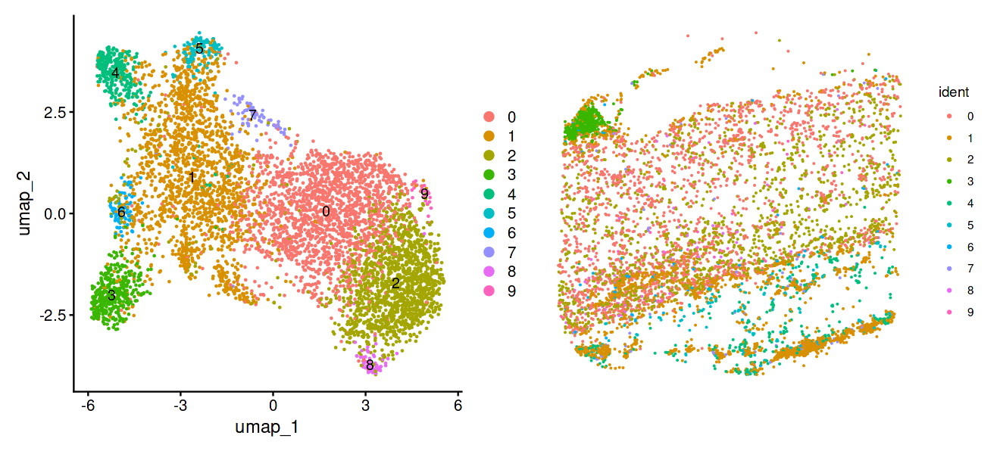

In [132]:
plot1 <- DimPlot(aorta, reduction = "umap", label = TRUE)
plot2 <- SpatialDimPlot(aorta, stroke = 0)
options(repr.plot.width=11, repr.plot.height=5)
plot1 + plot2

In [133]:
int_w_rna(aorta)->aorta

Normalizing query using reference SCT model

Performing PCA on the provided reference using 1666 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 1034 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Different cells and/or features from existing assay predictions”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”


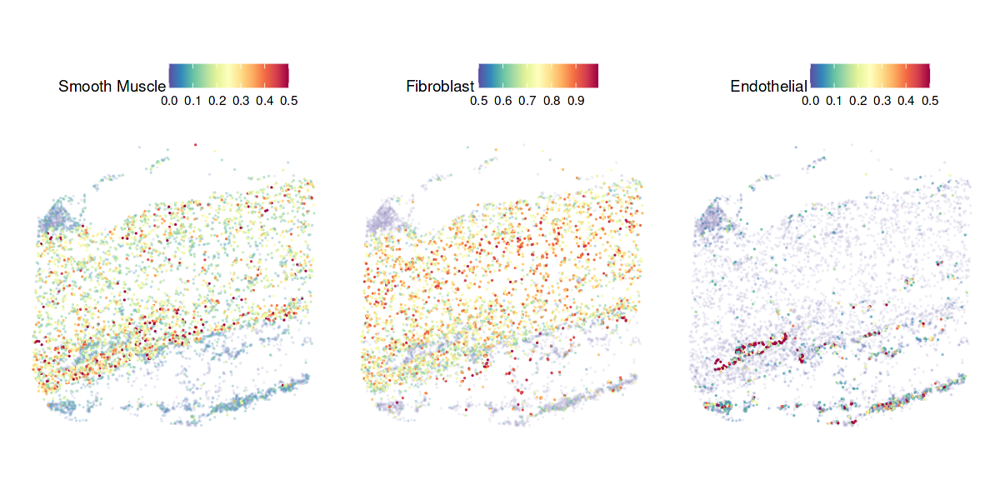

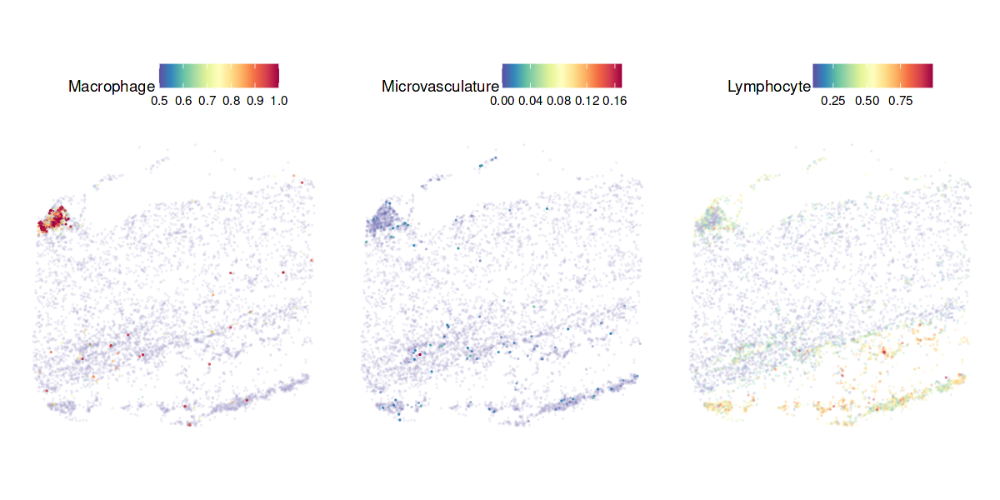

In [189]:
DefaultAssay(aorta) <- "predictions"
options(repr.plot.width=10, repr.plot.height=5)
SpatialFeaturePlot(aorta, features = c("Smooth Muscle"),max.cutoff=0.5,alpha = c(0.1, 2))->p1
SpatialFeaturePlot(aorta, features = c("Fibroblast"), min.cutoff=0.5,alpha = c(0.1, 2))->p2
SpatialFeaturePlot(aorta, features = c("Endothelial"), max.cutoff=0.5,alpha = c(0.1, 5))->p3
SpatialFeaturePlot(aorta, features = c("Macrophage"), min.cutoff=0.5,alpha = c(0.1, 1))->p4
SpatialFeaturePlot(aorta, features = c("Microvasculature"), alpha = c(0.1, 10))->p5
SpatialFeaturePlot(aorta, features = c("Lymphocyte"),min.cutoff=0.1,alpha = c(0.1, 0.5))->p6
p1+p2+p3
p4+p5+p6

In [176]:
rctd_proc<-function(i,n=30){
    Idents(ref) <- ref$celltype3
    # extract information to pass to the RCTD Reference function
    counts <- ref[["RNA"]]$counts
    cluster <- as.factor(ref$celltype3)
    names(cluster) <- colnames(ref)
    nUMI <- ref$nCount_RNA
    names(nUMI) <- colnames(ref)
    reference <- Reference(counts, cluster, nUMI)
    # set up query with the RCTD function SpatialRNA
    counts <- i[["RNA"]]$counts
    coords <- GetTissueCoordinates(i)
    colnames(coords) <- c("x", "y")
    coords[is.na(colnames(coords))] <- NULL
    query <- SpatialRNA(coords, counts, colSums(counts))
    RCTD <- create.RCTD(query, reference, max_cores = n)
    RCTD <- run.RCTD(RCTD, doublet_mode = "doublet")
    i <- AddMetaData(i, metadata = RCTD@results$results_df)
    return(i)
}

In [177]:
rctd_proc(rca)->rca

Warning message in Reference(counts, cluster, nUMI):
“Reference: number of cells per cell type is 33897, larger than maximum allowable of 10000. Downsampling number of cells to: 10000”
Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 52259

process_cell_type_info: number of genes in reference: 23024




     Endothelial       Fibroblast       Lymphocyte Microvasculature 
           10000            10000             2259            10000 
   Smooth Muscle       Macrophage 
           10000            10000 


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 128

get_de_genes: Fibroblast found DE genes: 130

get_de_genes: Lymphocyte found DE genes: 89

get_de_genes: Microvasculature found DE genes: 120

get_de_genes: Smooth Muscle found DE genes: 135

get_de_genes: Macrophage found DE genes: 215

get_de_genes: total DE genes: 708

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: E

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"
[1] "gather_results: finished 7000"
[1] "gather_results: finished 8000"
[1] "gather_results: finished 9000"
[1] "gather_results: finished 10000"
[1] "gather_results: finished 11000"
[1] "gather_results: finished 12000"


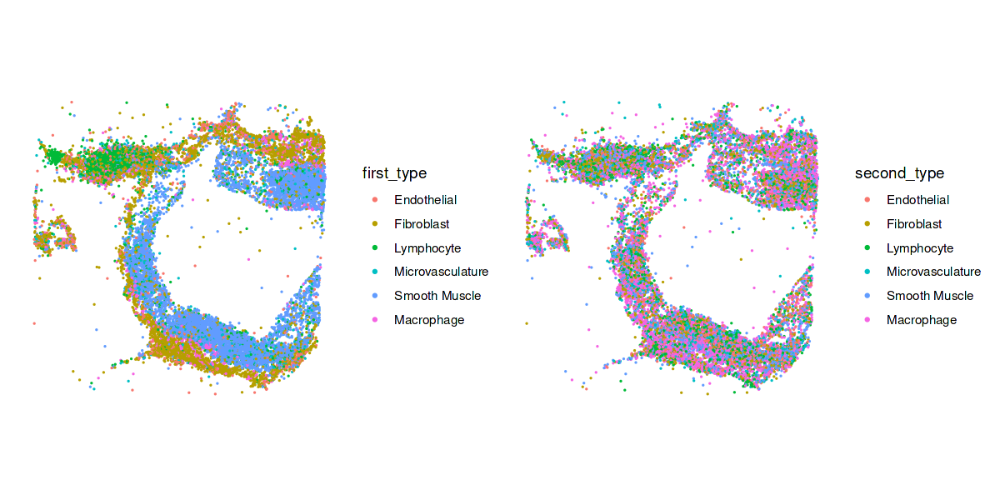

In [178]:
p1 <- SpatialDimPlot(rca, group.by = "first_type")
p2 <- SpatialDimPlot(rca, group.by = "second_type")
p1 | p2

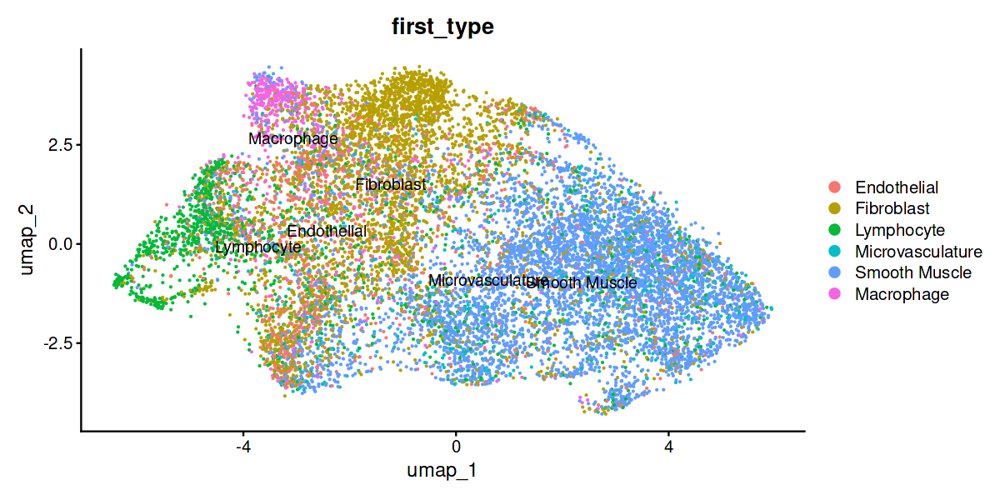

In [195]:
DimPlot(rca, reduction = "umap", label = TRUE,group.by='first_type')

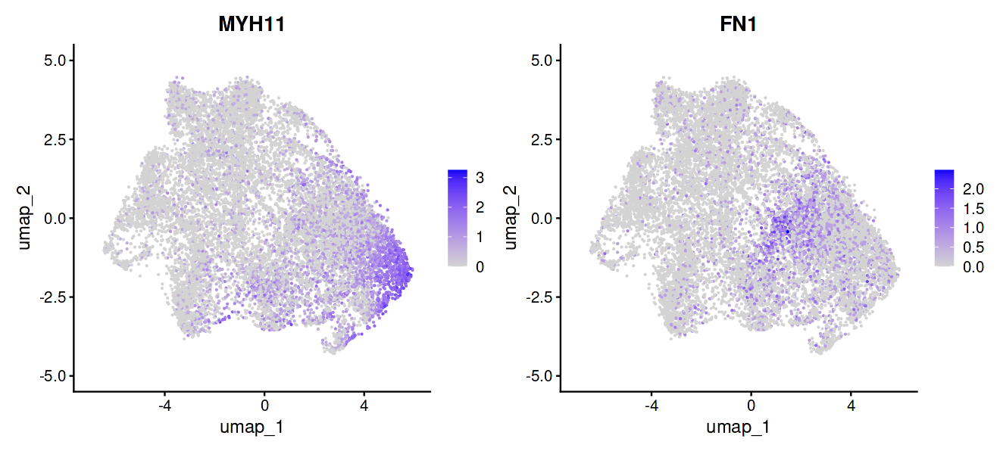

In [226]:
DefaultAssay(rca)<-'SCT'
FeaturePlot(rca, reduction = "umap", features = c('MYH11','FN1'))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


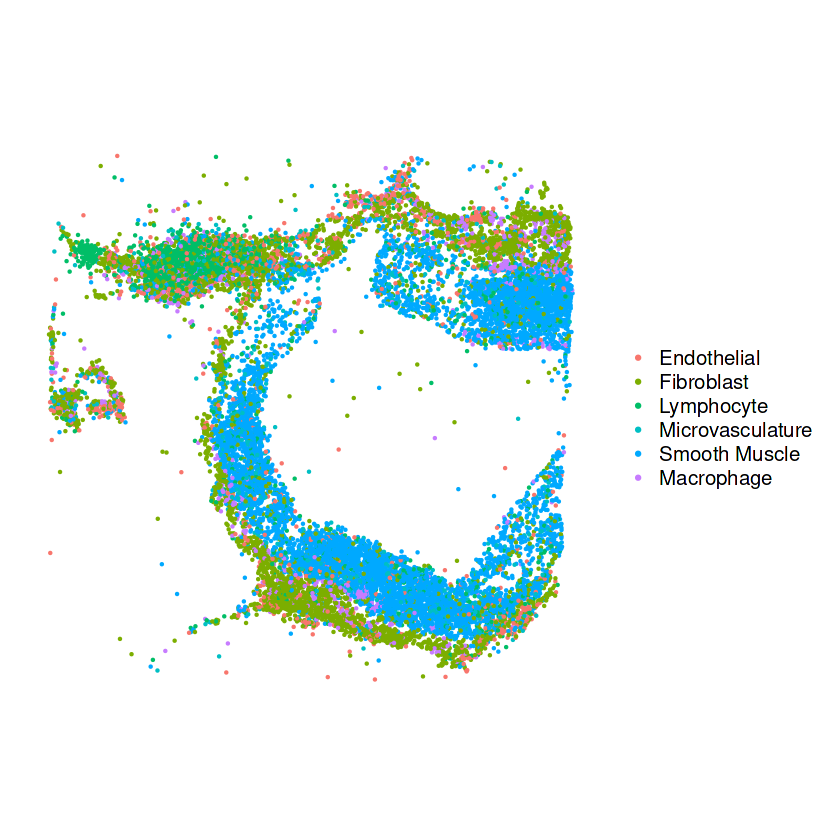

In [8]:
options(repr.plot.width=7, repr.plot.height=7)
SpatialDimPlot(rca, group.by = "first_type")+	theme(
		legend.key.size = unit(0.2,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)+ scale_fill_manual(values=c('#F8766D','#7CAE00','#00BE67','#00BFC4','#00A9FF','#C77CFF'))

In [308]:
gg_color_hue(6)

[1] "#F8766D" "#B79F00" "#00BA38" "#00BFC4" "#619CFF" "#F564E3"

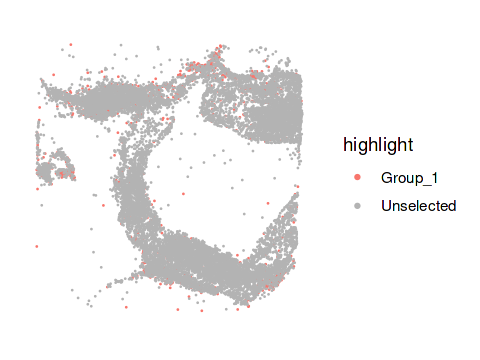

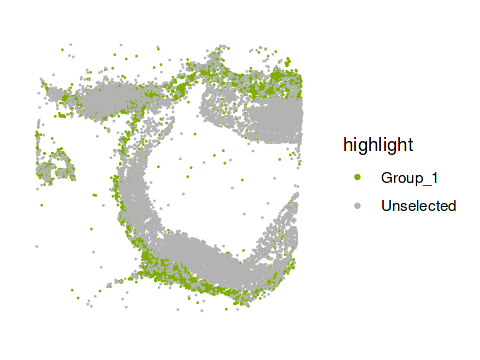

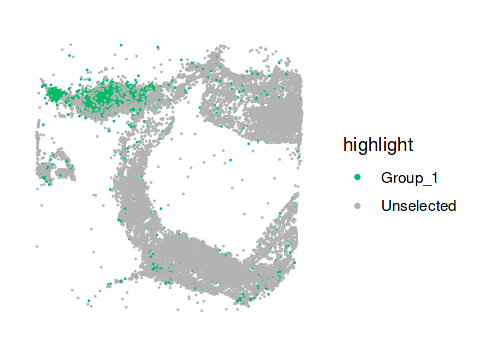

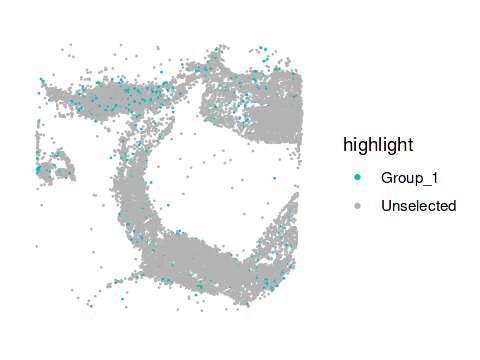

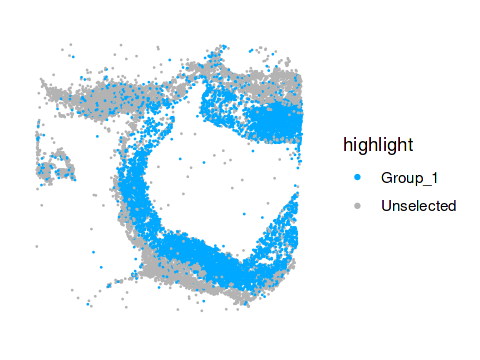

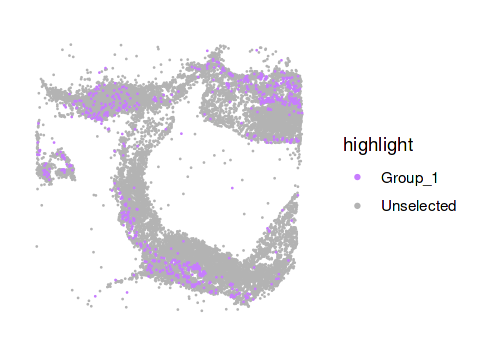

In [6]:
Idents(rca)<-rca$first_type
options(repr.plot.width=4, repr.plot.height=3)
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Endothelial"))),
         cols.highlight = c("#F8766D", "grey70"))
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Fibroblast"))),
         cols.highlight = c("#7CAE00", "grey70"))
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Lymphocyte"))),
         cols.highlight = c("#00BE67", "grey70"))
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Microvasculature"))),
         cols.highlight = c("#00BFC4", "grey70"))
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Smooth Muscle"))),
         cols.highlight = c("#00A9FF", "grey70"))
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Macrophage"))),
         cols.highlight = c("#C77CFF", "grey70"))

In [179]:
rctd_proc(aorta)->aorta

Warning message in Reference(counts, cluster, nUMI):
“Reference: number of cells per cell type is 33897, larger than maximum allowable of 10000. Downsampling number of cells to: 10000”
Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 52259

process_cell_type_info: number of genes in reference: 23024




     Endothelial       Fibroblast       Lymphocyte Microvasculature 
           10000            10000             2259            10000 
   Smooth Muscle       Macrophage 
           10000            10000 


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 128

get_de_genes: Fibroblast found DE genes: 130

get_de_genes: Lymphocyte found DE genes: 77

get_de_genes: Microvasculature found DE genes: 119

get_de_genes: Smooth Muscle found DE genes: 132

get_de_genes: Macrophage found DE genes: 212

get_de_genes: total DE genes: 691

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: E

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"


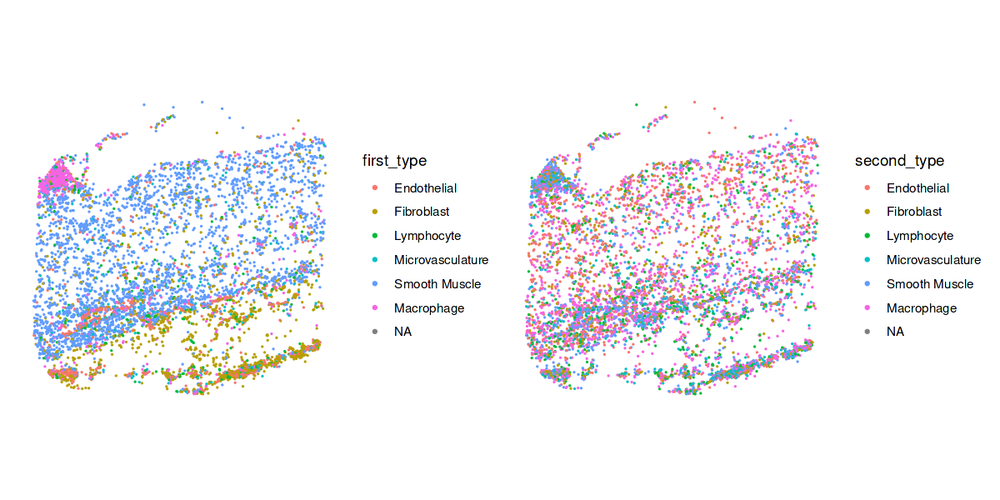

In [180]:
p1 <- SpatialDimPlot(aorta, group.by = "first_type")
p2 <- SpatialDimPlot(aorta, group.by = "second_type")
p1 | p2

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


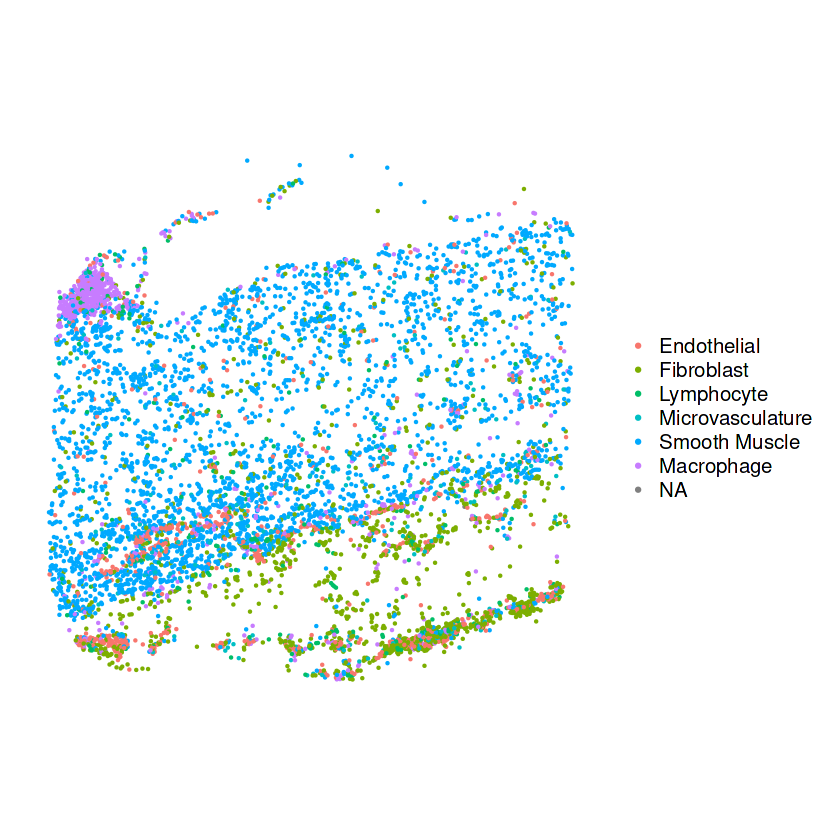

In [9]:
options(repr.plot.width=7, repr.plot.height=7)
SpatialDimPlot(aorta, group.by = "first_type")+	theme(
		legend.key.size = unit(0.2,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)+ scale_fill_manual(values=c('#F8766D','#7CAE00','#00BE67','#00BFC4','#00A9FF','#C77CFF'))

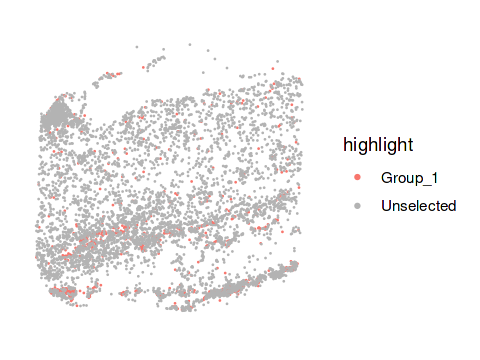

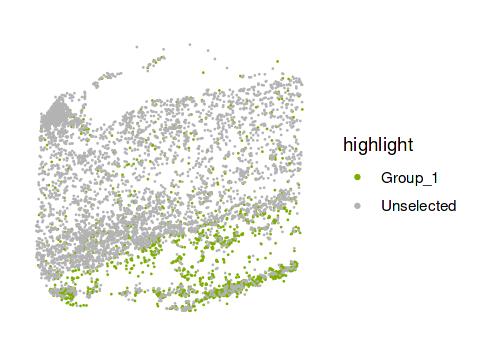

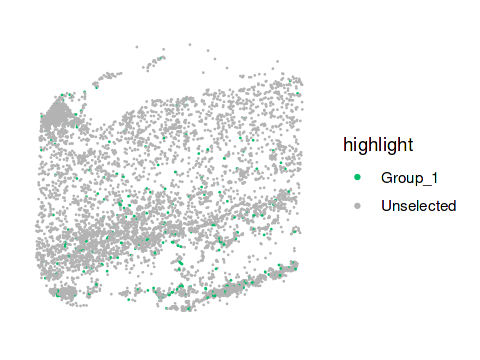

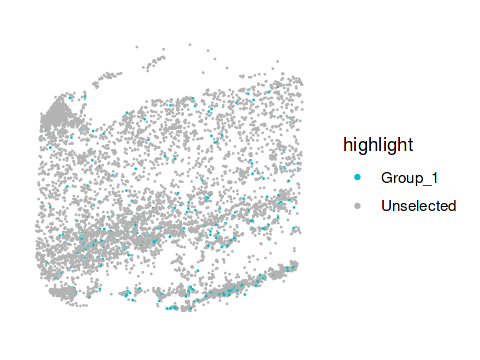

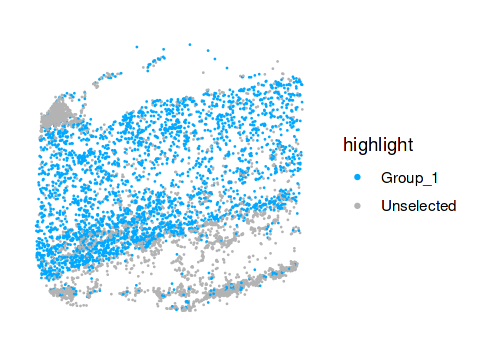

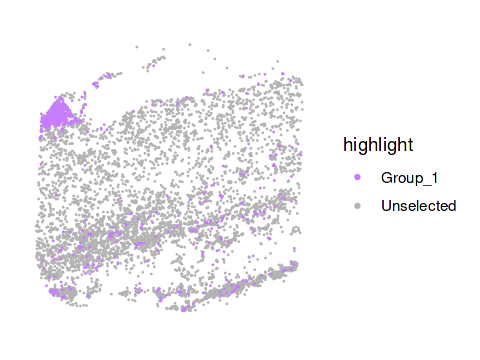

In [10]:
Idents(aorta)<-aorta$first_type
options(repr.plot.width=4, repr.plot.height=3)
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Endothelial"))),
         cols.highlight = c("#F8766D", "grey70"))
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Fibroblast"))),
         cols.highlight = c("#7CAE00", "grey70"))
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Lymphocyte"))),
         cols.highlight = c("#00BE67", "grey70"))
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Microvasculature"))),
         cols.highlight = c("#00BFC4", "grey70"))
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Smooth Muscle"))),
         cols.highlight = c("#00A9FF", "grey70"))
SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Macrophage"))),
         cols.highlight = c("#C77CFF", "grey70"))

In [181]:
saveRDS(aorta,'RDS/Aorta_spatial2.rds')

In [182]:
saveRDS(rca,'RDS/RCA_spatial2.rds')

In [4]:
readRDS('RDS/Aorta_spatial2.rds')->aorta
readRDS('RDS/RCA_spatial2.rds')->rca

In [10]:
as.data.frame(table(aorta$first_type))

Var1,Freq
<fct>,<int>
Endothelial,698
Fibroblast,1231
Lymphocyte,257
Microvasculature,257
Smooth Muscle,3039
Macrophage,658


In [11]:
as.data.frame(table(rca$first_type))

Var1,Freq
<fct>,<int>
Endothelial,1067
Fibroblast,3564
Lymphocyte,1378
Microvasculature,668
Smooth Muscle,5350
Macrophage,717


In [246]:
rctd_proc_2<-function(i,n=30){
    Idents(ref) <- ref$celltype4
    # extract information to pass to the RCTD Reference function
    counts <- ref[["RNA"]]$counts
    cluster <- as.factor(ref$celltype4)
    names(cluster) <- colnames(ref)
    nUMI <- ref$nCount_RNA
    names(nUMI) <- colnames(ref)
    reference <- Reference(counts, cluster, nUMI)
    # set up query with the RCTD function SpatialRNA
    counts <- i[["RNA"]]$counts
    coords <- GetTissueCoordinates(i)
    colnames(coords) <- c("x", "y")
    coords[is.na(colnames(coords))] <- NULL
    query <- SpatialRNA(coords, counts, colSums(counts))
    RCTD <- create.RCTD(query, reference, max_cores = n)
    RCTD <- run.RCTD(RCTD, doublet_mode = "doublet")
    i <- AddMetaData(i, metadata = RCTD@results$results_df)
    return(i)
}

In [247]:
rctd_proc_2(rca)->rca

Warning message in Reference(counts, cluster, nUMI):
“Reference: number of cells per cell type is 24079, larger than maximum allowable of 10000. Downsampling number of cells to: 10000”
Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 62077

process_cell_type_info: number of genes in reference: 23024




           Macrophage      Microvasculature            Fibroblast 
                10000                 10000                 10000 
          Endothelial Smooth Muscle_Intimal  Smooth Muscle_Medial 
                10000                  9818                 10000 
           Lymphocyte 
                 2259 


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Macrophage found DE genes: 217

get_de_genes: Microvasculature found DE genes: 103

get_de_genes: Fibroblast found DE genes: 111

get_de_genes: Endothelial found DE genes: 126

get_de_genes: Smooth Muscle_Intimal found DE genes: 94

get_de_genes: Smooth Muscle_Medial found DE genes: 109

get_de_genes: Lympho

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"
[1] "gather_results: finished 7000"
[1] "gather_results: finished 8000"
[1] "gather_results: finished 9000"
[1] "gather_results: finished 10000"
[1] "gather_results: finished 11000"
[1] "gather_results: finished 12000"


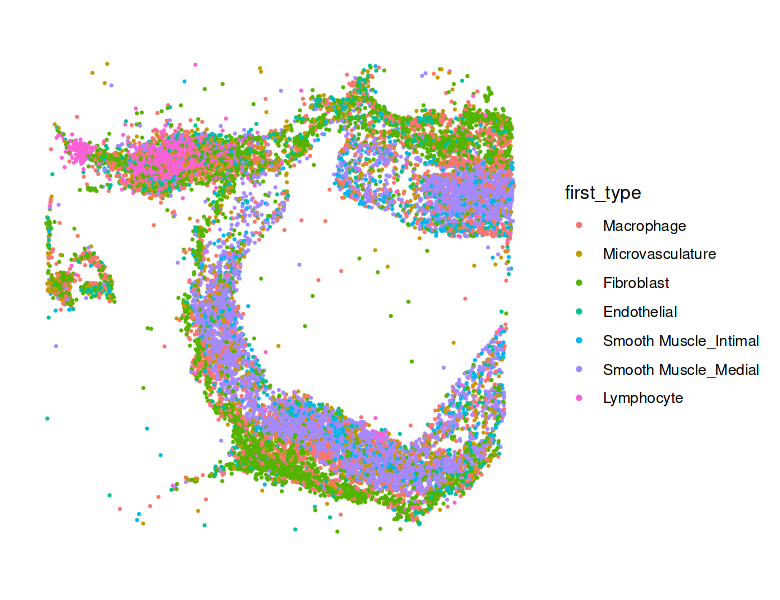

In [249]:
SpatialDimPlot(rca, group.by = "first_type")

In [260]:
Idents(rca)<-rca$first_type

In [252]:
gg_color_hue(7)

[1] "#F8766D" "#C49A00" "#53B400" "#00C094" "#00B6EB" "#A58AFF" "#FB61D7"

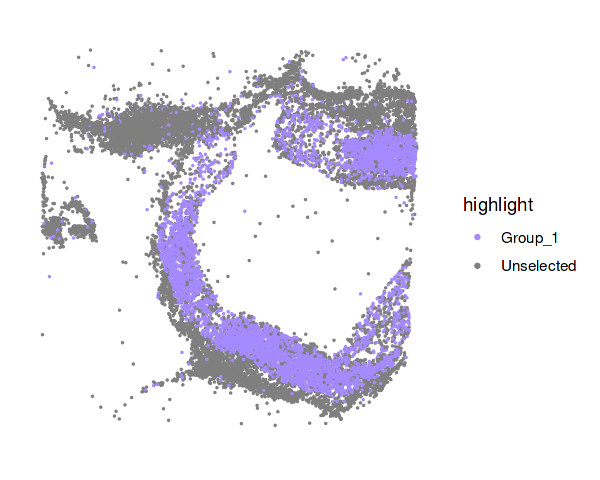

In [265]:
options(repr.plot.width=5, repr.plot.height=4)
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Smooth Muscle_Medial"))),
         cols.highlight = c("#A58AFF", "grey50"))

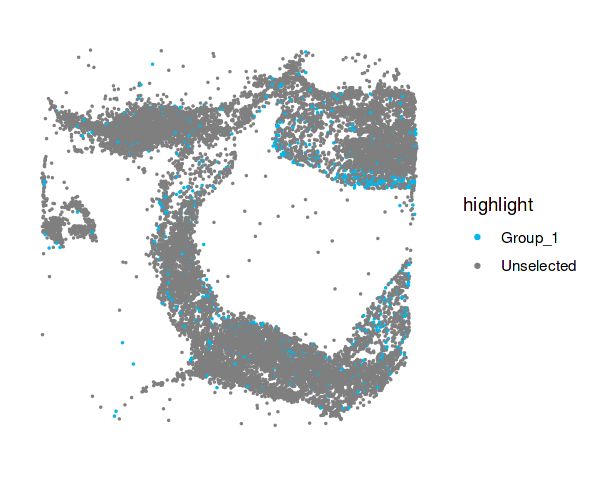

In [263]:
options(repr.plot.width=5, repr.plot.height=4)
SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Smooth Muscle_Intimal"))),
         cols.highlight = c("#00B6EB", "grey50"))

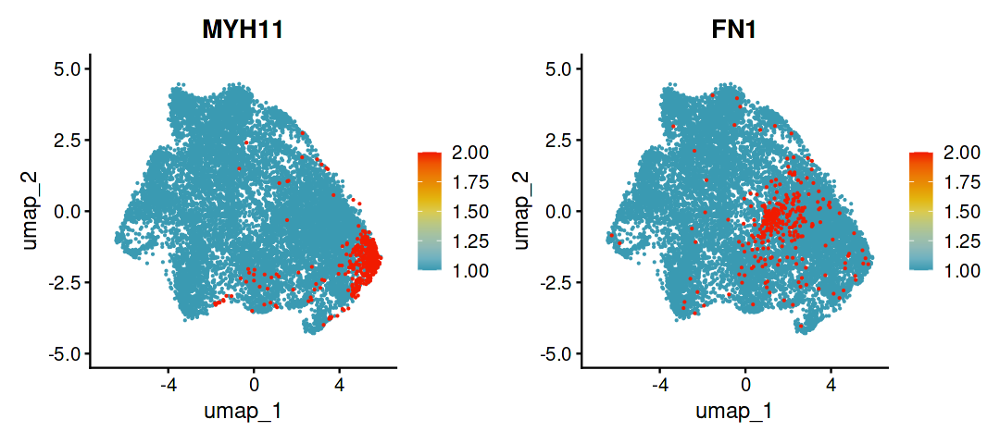

In [279]:
DefaultAssay(rca)<-'SCT'
options(repr.plot.width=9, repr.plot.height=4)
FeaturePlot(rca, reduction = "umap", features = c('MYH11','FN1'), cols = pal,min.cutoff = 0.01,order=T)

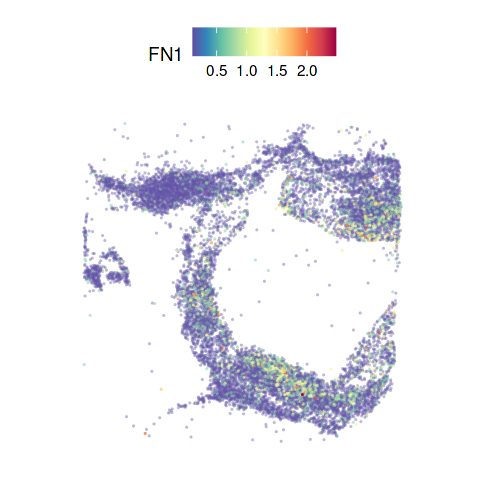

In [28]:
DefaultAssay(rca)<-'SCT'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('FN1'),min.cutoff =0.1, alpha = c(0.4, 1))

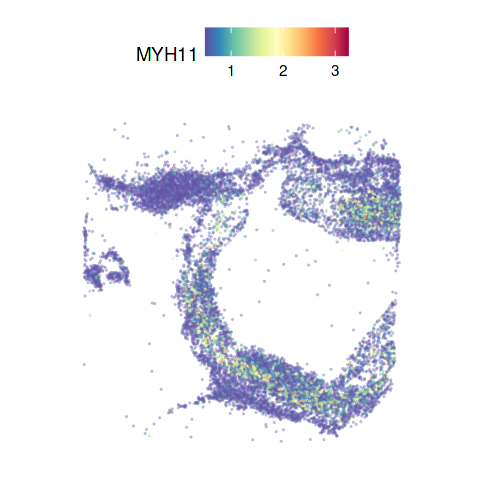

In [26]:
DefaultAssay(rca)<-'SCT'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('MYH11'),min.cutoff =0.5, alpha = c(0.4, 1))

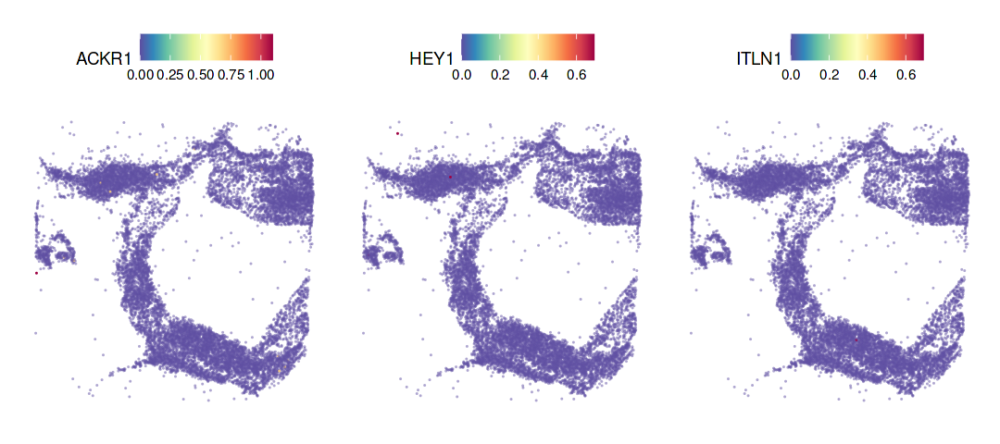

In [326]:
DefaultAssay(rca)<-'SCT'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('ACKR1','HEY1','ITLN1'),min.cutoff =0, alpha = c(0.5, 1))

Warning message:
“Could not find ITLN1 in the default search locations, found in ‘RNA’ assay instead”


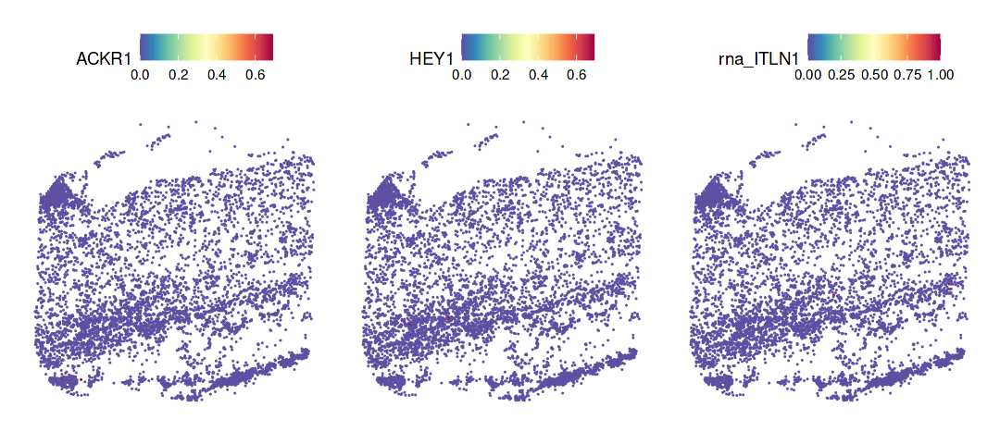

In [325]:
DefaultAssay(aorta)<-'SCT'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(aorta,features = c('ACKR1','HEY1','ITLN1'),min.cutoff =0, alpha = c(1, 1))

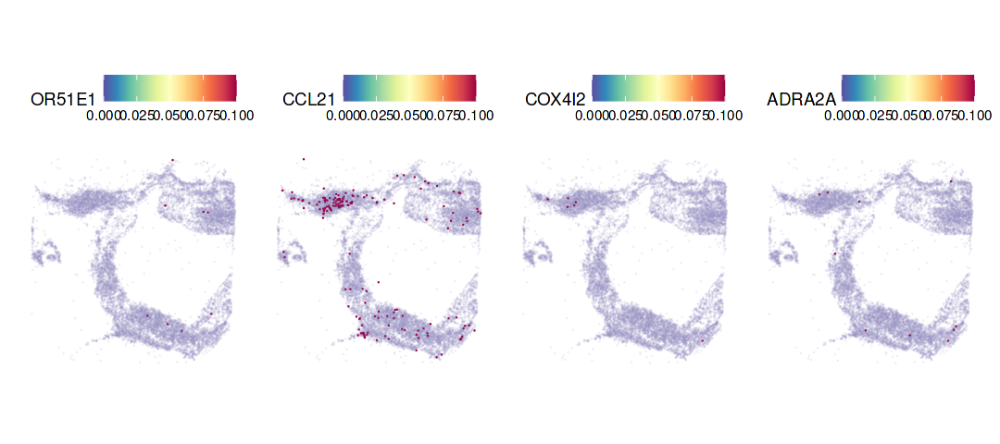

In [51]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('OR51E1','CCL21','COX4I2','ADRA2A'),min.cutoff =0, alpha = c(0.1, 1),ncol = 4,max.cutoff =0.1)

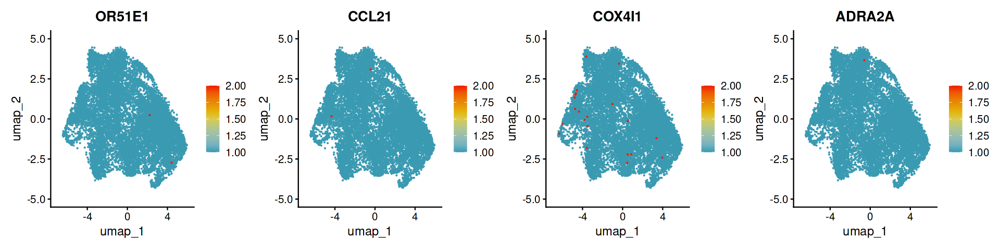

In [15]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=16, repr.plot.height=4)
FeaturePlot(rca, reduction = "umap", features = c('OR51E1','CCL21','COX4I1','ADRA2A'), cols = pal,min.cutoff = 0.01,ncol=4,order=T)

Warning message:
“The following requested variables were not found: OR51E1”


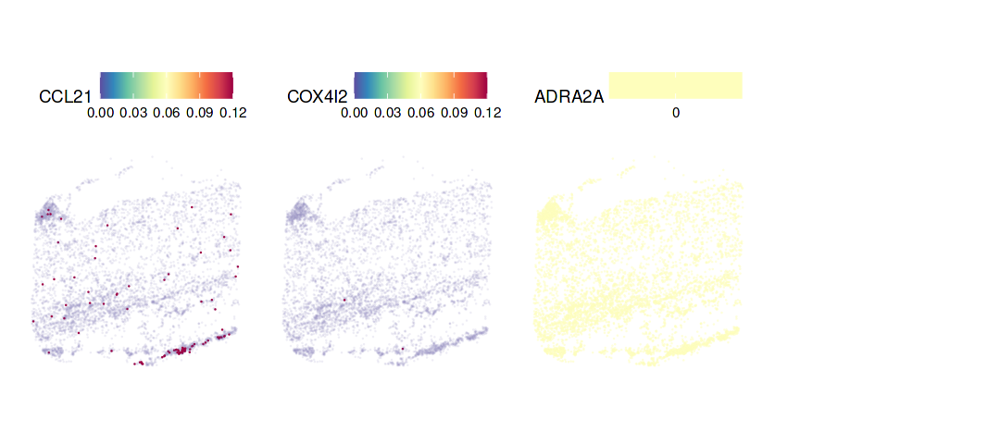

In [50]:
DefaultAssay(aorta)<-'RNA'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(aorta,features = c('OR51E1','CCL21','COX4I2','ADRA2A'),min.cutoff =0, alpha = c(0.1, 1),ncol = 4,max.cutoff =0.12)

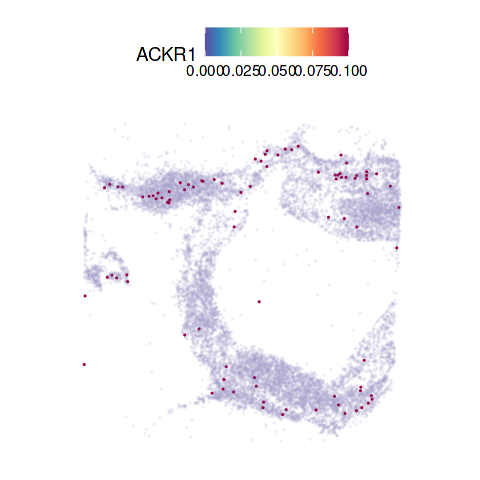

In [48]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('ACKR1'),min.cutoff =0, alpha = c(0.1, 1),max.cutoff =0.1)

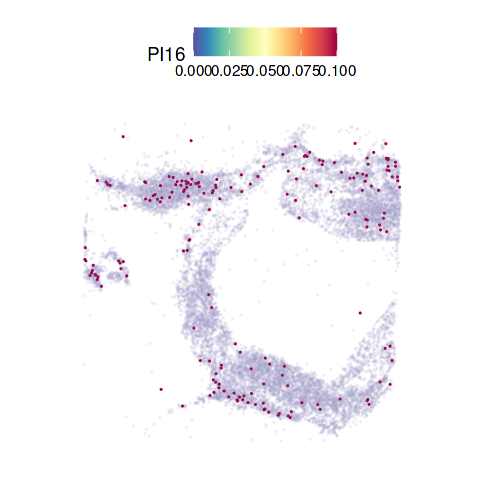

In [47]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('PI16'),min.cutoff =0, alpha = c(0.1, 1),max.cutoff =0.1)

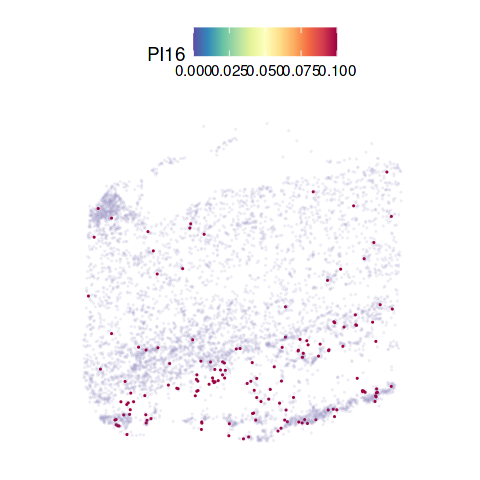

In [46]:
DefaultAssay(aorta)<-'RNA'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(aorta,features = c('PI16'),min.cutoff =0, alpha = c(0.1, 1),max.cutoff =0.1)

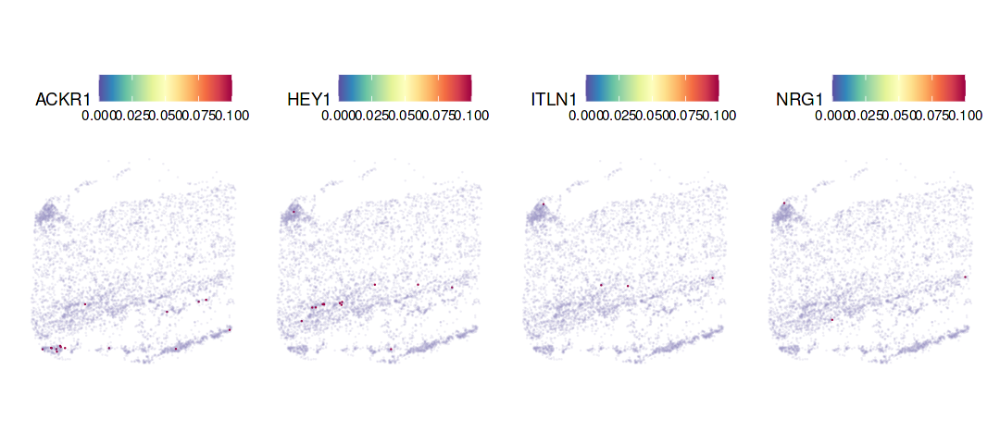

In [54]:
DefaultAssay(aorta)<-'RNA'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(aorta,features = c('ACKR1','HEY1','ITLN1','NRG1'),min.cutoff =0, alpha = c(0.1, 1),ncol = 4,max.cutoff =0.1)

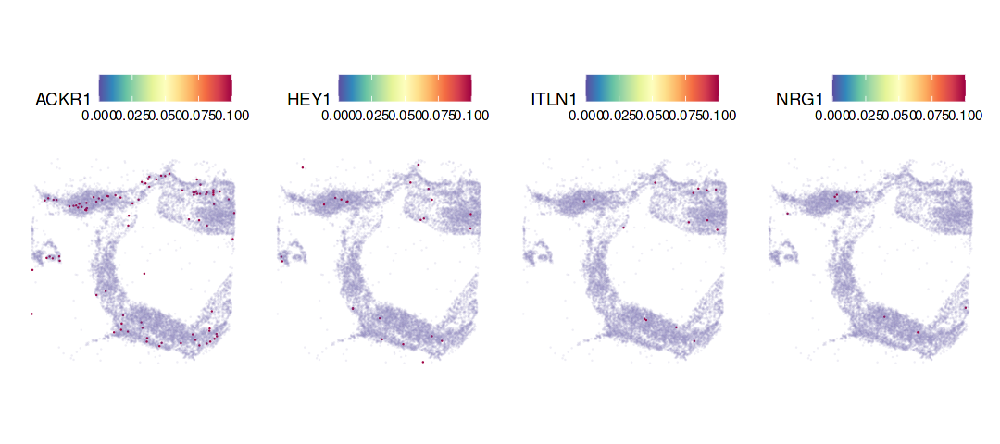

In [55]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=9, repr.plot.height=4)
SpatialFeaturePlot(rca,features = c('ACKR1','HEY1','ITLN1','NRG1'),min.cutoff =0, alpha = c(0.1, 1),ncol = 4,max.cutoff =0.1)

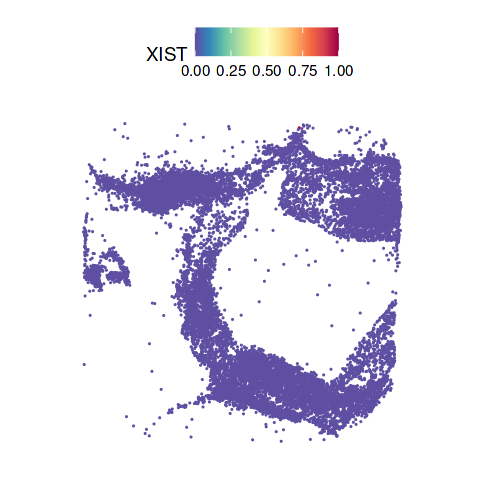

In [6]:
DefaultAssay(rca)<-'RNA'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(rca,features='XIST')

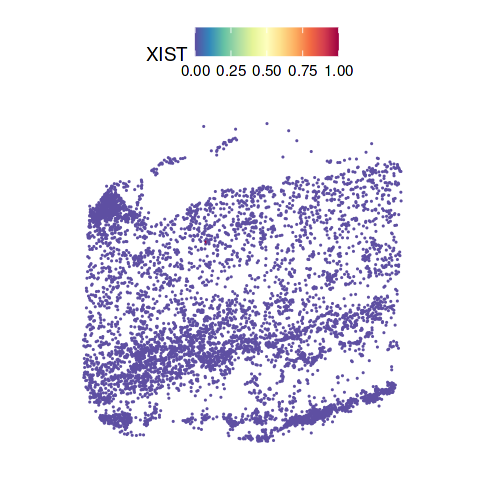

In [8]:
DefaultAssay(aorta)<-'RNA'
options(repr.plot.width=4, repr.plot.height=4)
SpatialFeaturePlot(aorta,features='XIST')

In [16]:
write.csv(rca@meta.data,'Meta/rca.meta',quote=F)

In [17]:
write.csv(aorta@meta.data,'Meta/aorta.meta',quote=F)